In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib widget

In [2]:
import numpy as np
import random
import sys

sys.path.append('../tools')

import os

import torch

import pandas as pd
from sklearn.model_selection import train_test_split
import pytorch_lightning as pl
import pytorch_lightning.loggers as pl_loggers
import pytorch_lightning.callbacks as pl_callbacks
import data_utility, annotation_utility
from models.rns_dataloader import *
from active_learning_utility import get_strategy
from active_learning_data import Data
from active_learning_net import Net
from copy import deepcopy
from models.SwaV import SwaV
from models.LSTMDownStream import SupervisedDownstream
import warnings
import matplotlib.pyplot as plt
import pickle
warnings.filterwarnings("ignore")


In [3]:
random_seed = 42
random.seed(random_seed)
torch.manual_seed(random_seed)
np.random.seed(random_seed)

if torch.cuda.is_available():
    torch.cuda.manual_seed(random_seed)
    # True ensures the algorithm selected by CUFA is deterministic
    torch.backends.cudnn.deterministic = True
    # torch.set_deterministic(True)
    # False ensures CUDA select the same algorithm each time the application is run
    torch.backends.cudnn.benchmark = False

import pytorch_lightning

pytorch_lightning.utilities.seed.seed_everything(seed=random_seed, workers=True)

Global seed set to 42


42

In [4]:
data_dir = "../../../user_data/"
log_folder_root = '../../../user_data/logs/'
ckpt_folder_root = '../../../user_data/checkpoints/'

In [5]:
strategy_name = 'LeastConfidence'

In [6]:
nStart = 1
nEnd = 20
nQuery = 2

In [7]:
args_task = {'n_epoch': 50,
             'transform_train': True,
             'strategy_name': strategy_name,
             'transform': False,
             'loader_tr_args': {'batch_size': 2, 'num_workers': 4, 'collate_fn': collate_fn,
                                'drop_last': True, 'persistent_workers': True},
             'loader_te_args': {'batch_size': 1, 'num_workers': 4, 'collate_fn': collate_fn,
                                'drop_last': True, 'persistent_workers': True}
             }

In [8]:
# raw_annotations = pd.read_csv(data_dir + 'full_updated_anns_annotTbl_cleaned.csv')
# ids = list(np.unique(raw_annotations[raw_annotations['descriptions'].notnull()]['HUP_ID']))
# # ids = list(np.unique(raw_annotations['HUP_ID']))
#
# data_import = data_utility.read_files(path=data_dir+'rns_data', path_data=data_dir+'rns_raw_cache', patientIDs=ids,
#                                       verbose=True)  # Import data with annotation

In [9]:
# data_list = os.listdir(data_dir+'rns_test_cache')
# print(data_list)
data_list = ['HUP047.npy', 'HUP084.npy', 'HUP096.npy', 'HUP109.npy', 'HUP121.npy', 'HUP129.npy', 'HUP131.npy',
             'HUP137.npy', 'HUP147.npy', 'HUP156.npy', 'HUP159.npy', 'HUP182.npy', 'HUP197.npy', 'HUP199.npy',
             'RNS026.npy', 'RNS029.npy']
# data_list = os.listdir(data_dir+'rns_test_cache')[1:]

# data_list = ['HUP182.npy',   'HUP129.npy',   'HUP109.npy', 'HUP156.npy', 'HUP096.npy', 'RNS026.npy',  'HUP159.npy']
# data_list = ['RNS026.npy', 'HUP159.npy', 'HUP129.npy', 'HUP096.npy', 'HUP182.npy']
train_data, train_label, test_data, test_label, train_index, test_index = get_data_by_episode(data_list, split=0.8)
# data, label,_,_ = get_data(data_list, split=1)
# train_data, test_data, train_label, test_label = sklearn.model_selection.train_test_split(data, label, test_size=0.8, random_state=42)

print(train_data.shape)
print(train_label.shape)
print(test_data.shape)
print(test_label.shape)

16it [00:07,  2.15it/s]

(992,)
(992,)
(270,)
(270,)


In [10]:
X_train = np.concatenate(train_data)
y_train = np.concatenate(train_label)
X_test = np.concatenate(test_data)
y_test = np.concatenate(test_label)
index_train = np.concatenate(train_index)
index_test = np.concatenate(test_index)
seq_len_train = np.array([y.shape[0] for y in train_label])
seq_len_test = np.array([y.shape[0] for y in test_label])

In [11]:
n_pool = len(train_data)
n_test = len(test_data)

NUM_INIT_LB = int(nStart * n_pool / 100)
NUM_QUERY = int(nQuery * n_pool / 100) if nStart != 100 else 0
NUM_ROUND = int((int(nEnd * n_pool / 100) - NUM_INIT_LB) / NUM_QUERY) if nStart != 100 else 0
if NUM_QUERY != 0:
    if (int(nEnd * n_pool / 100) - NUM_INIT_LB) % NUM_QUERY != 0:
        NUM_ROUND += 1

print(NUM_INIT_LB)
print(NUM_QUERY)
print(NUM_ROUND)

9
19
10


In [12]:
dataset = Data(X_train, y_train, X_test, y_test, seq_len_train, seq_len_test, RNS_Active_by_episode_LSTM, args_task)

In [13]:
swav = SwaV().load_from_checkpoint(
    ckpt_folder_root + 'rns_swav_50_12/rns_swav-epoch=82-swav_loss=2.58204.ckpt')
model = SupervisedDownstream(swav.backbone)
# initialize model and save the model state
modelstate = deepcopy(model.state_dict())
device = "cuda" if torch.cuda.is_available() else "cpu"

net = Net(model, args_task, device, ckpt_folder_root='rns_active', log_folder_root='rns_active')

In [14]:
strategy = get_strategy(strategy_name, dataset, net, None, args_task, rns_data=True)

In [15]:
strategy.train()

Using 16bit native Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


ValueError: num_samples should be a positive integer value, but got num_samples=0

In [16]:
unlabeled_idxs, unlabeled_data = strategy.dataset.get_train_data_unaugmented()
emb, y = strategy.net.get_embeddings(unlabeled_data, return_target=True)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

In [17]:
np.save('emb_label.npy', y)

In [54]:
import pickle

with open(log_folder_root + 'rns_active_selected_p/' + 'LeastConfidence' + '/' + 'selected_indices.pkl', 'rb') as f:
    selected_inds = pickle.load(f)

added_index = []
for key in selected_inds.keys():
    added_index.append(selected_inds[key])
added_index_lc = added_index

added_index = []
for dt in np.load('RandomSampling.npy', allow_pickle=True):
    added_index.append(dt)
added_index.insert(0,added_index_lc[0])
added_index_rd = added_index

In [52]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

pca_comp_n = 30
batch_size = 32

pca = PCA(n_components=pca_comp_n, copy=True).fit(emb)
p = pca.transform(emb)

# ind = np.random.choice(len(emb), 10000)
#
tsne = TSNE(n_components=2, verbose=1, perplexity=75, random_state=142, init='pca')
z = tsne.fit_transform(emb)


[t-SNE] Computing 226 nearest neighbors...
[t-SNE] Indexed 85111 samples in 0.208s...
[t-SNE] Computed neighbors for 85111 samples in 110.606s...
[t-SNE] Computed conditional probabilities for sample 1000 / 85111
[t-SNE] Computed conditional probabilities for sample 2000 / 85111
[t-SNE] Computed conditional probabilities for sample 3000 / 85111
[t-SNE] Computed conditional probabilities for sample 4000 / 85111
[t-SNE] Computed conditional probabilities for sample 5000 / 85111
[t-SNE] Computed conditional probabilities for sample 6000 / 85111
[t-SNE] Computed conditional probabilities for sample 7000 / 85111
[t-SNE] Computed conditional probabilities for sample 8000 / 85111
[t-SNE] Computed conditional probabilities for sample 9000 / 85111
[t-SNE] Computed conditional probabilities for sample 10000 / 85111
[t-SNE] Computed conditional probabilities for sample 11000 / 85111
[t-SNE] Computed conditional probabilities for sample 12000 / 85111
[t-SNE] Computed conditional probabilities for 

In [51]:
np.max([np.max(ai) for ai in added_index_lc])

84876

In [54]:
np.save('tsne_emb.npy',z)


In [6]:
z = np.load('tsne_emb.npy')
y = np.load('emb_label.npy')

In [26]:
# for i in range(len(y)):
#     if np.sum(y[i])>0:
#         print(i)
target = [np.sign(np.sum(yy)) for yy in y]


In [35]:

interictal_inds = np.where(np.array(target) == 0)[0]
ictal_inds = np.where(np.array(target) == 1)[0]

spc = z

In [55]:
cumulative_list = []

# Temporary array to hold the cumulative elements
temp_array = []

for arr in added_index_lc:
    temp_array.extend(arr)
    # Append a copy of temp_array to ensure it doesn't get overwritten
    cumulative_list.append(temp_array.copy())

added_index_lc = [np.array(cl) for cl in cumulative_list]

cumulative_list = []

# Temporary array to hold the cumulative elements
temp_array = []

for arr in added_index_rd:
    temp_array.extend(arr)
    # Append a copy of temp_array to ensure it doesn't get overwritten
    cumulative_list.append(temp_array.copy())

added_index_rd = [np.array(cl) for cl in cumulative_list]

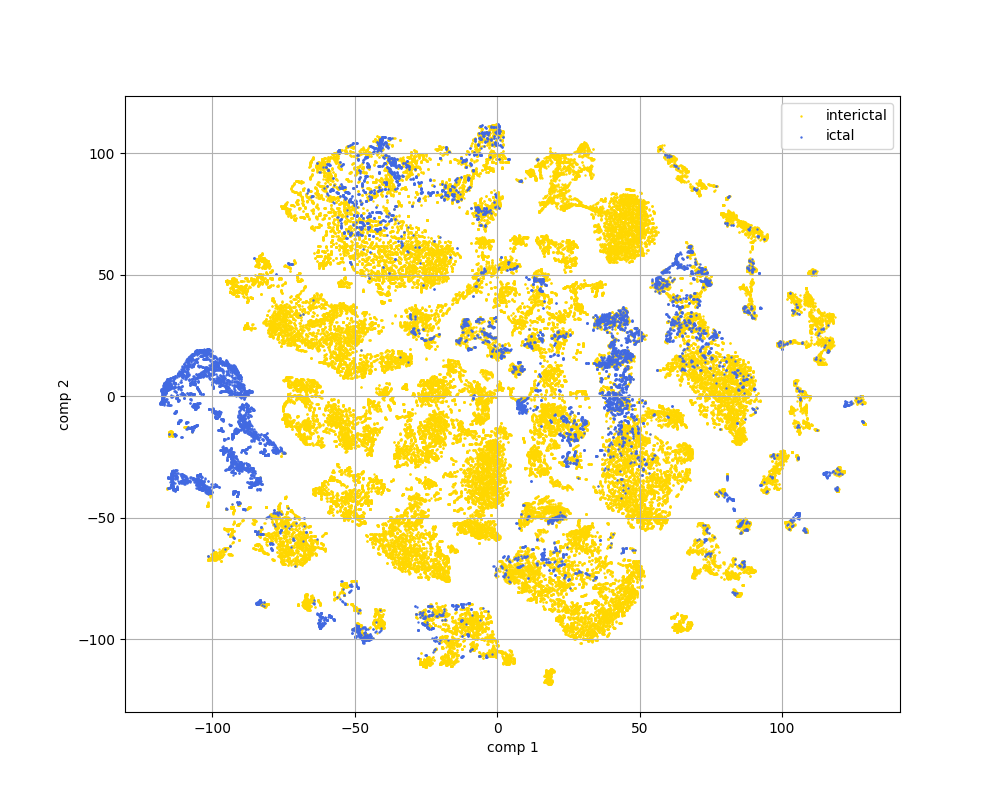

In [60]:


plt.figure(figsize=(10, 8))
plt.scatter(spc[interictal_inds,0],spc[interictal_inds,1],c='gold',label= 'interictal',s=0.5)
plt.scatter(spc[ictal_inds, 0], spc[ictal_inds, 1], c='royalblue', label='ictal',s=0.5)
# plt.scatter(spc[added_index_lc[i]][:,0], spc[added_index_lc[i]][:,1], c='red', label='selected',s=4)

# plt.title('Swav Embedding t-SNE')
plt.xlabel('comp 1')
plt.ylabel("comp 2")
plt.legend()
# plt.xlim(-67, 74)
# plt.ylim(-67, 75)
plt.grid()
plt.show()

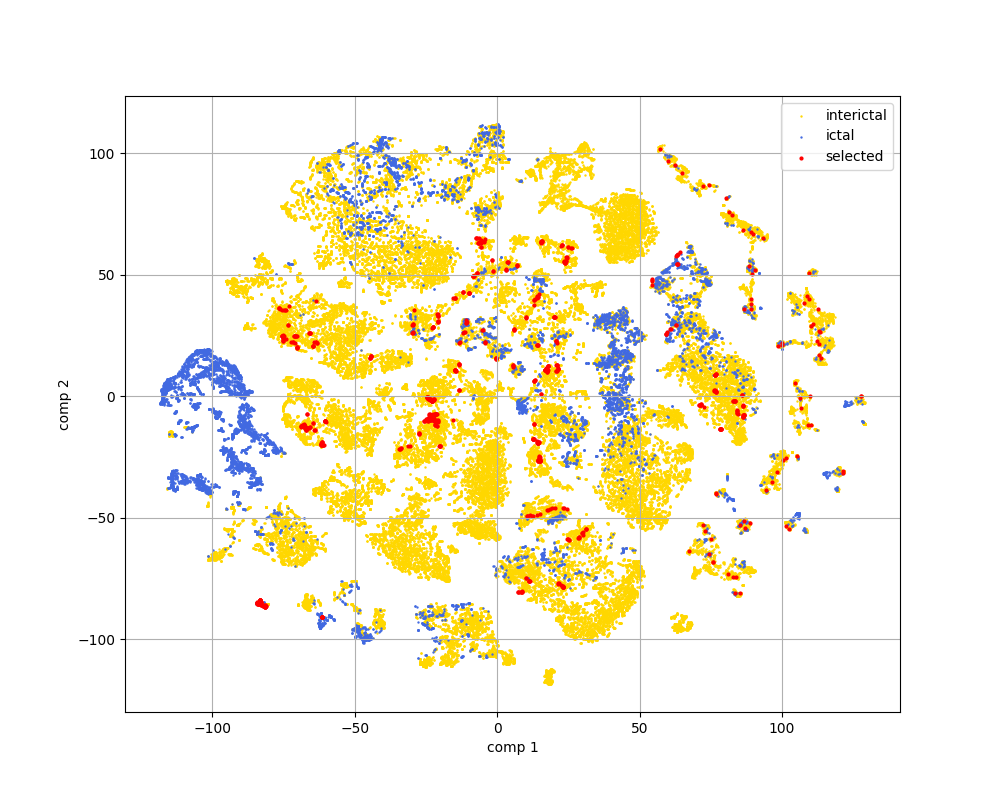

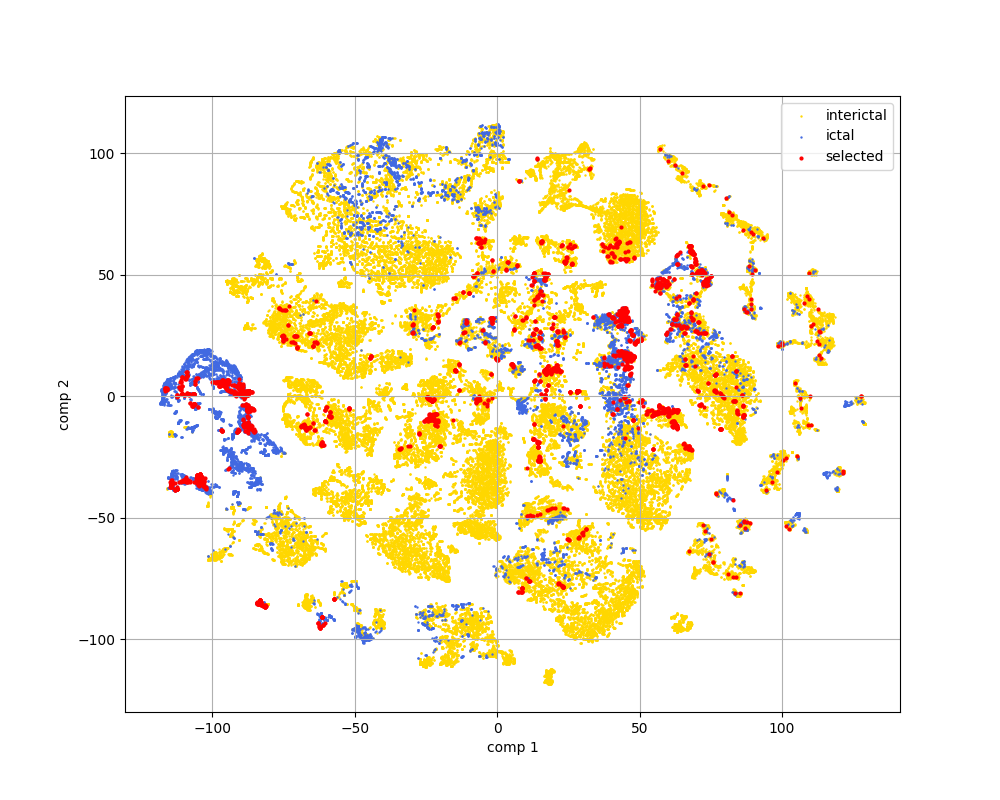

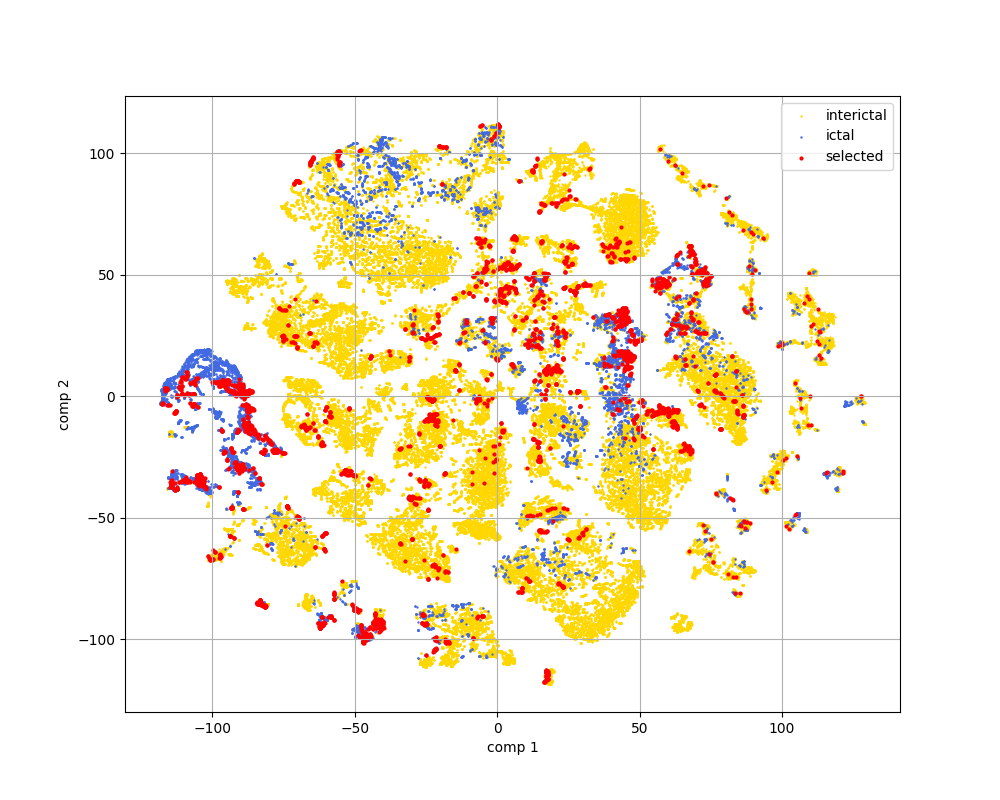

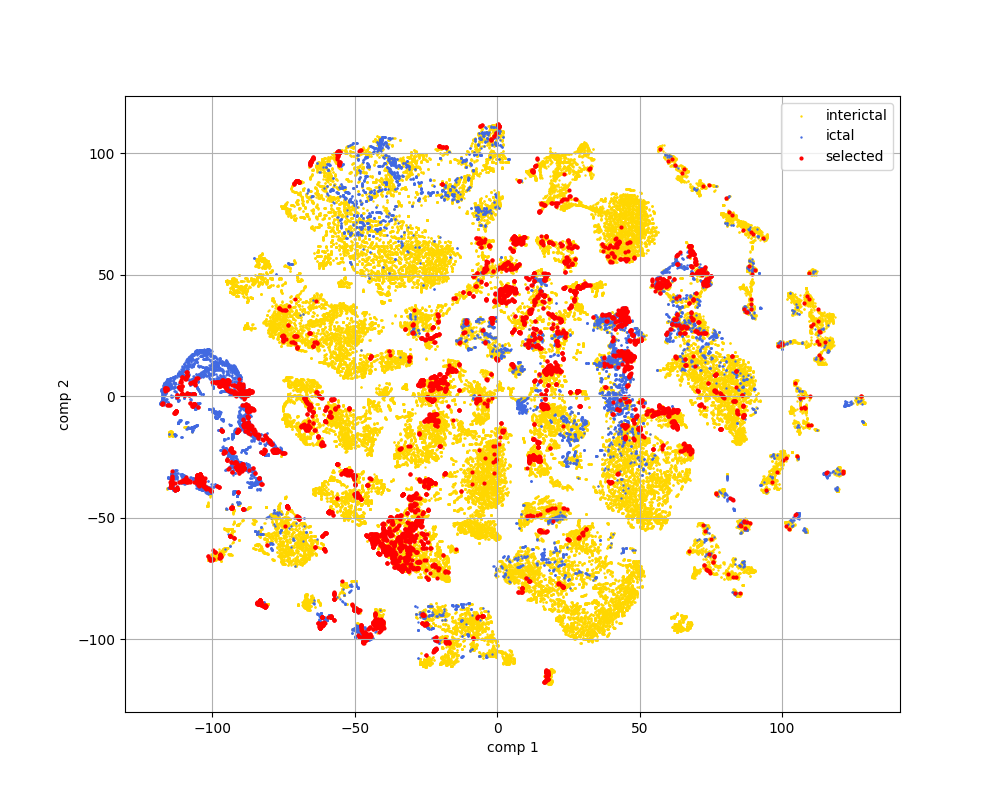

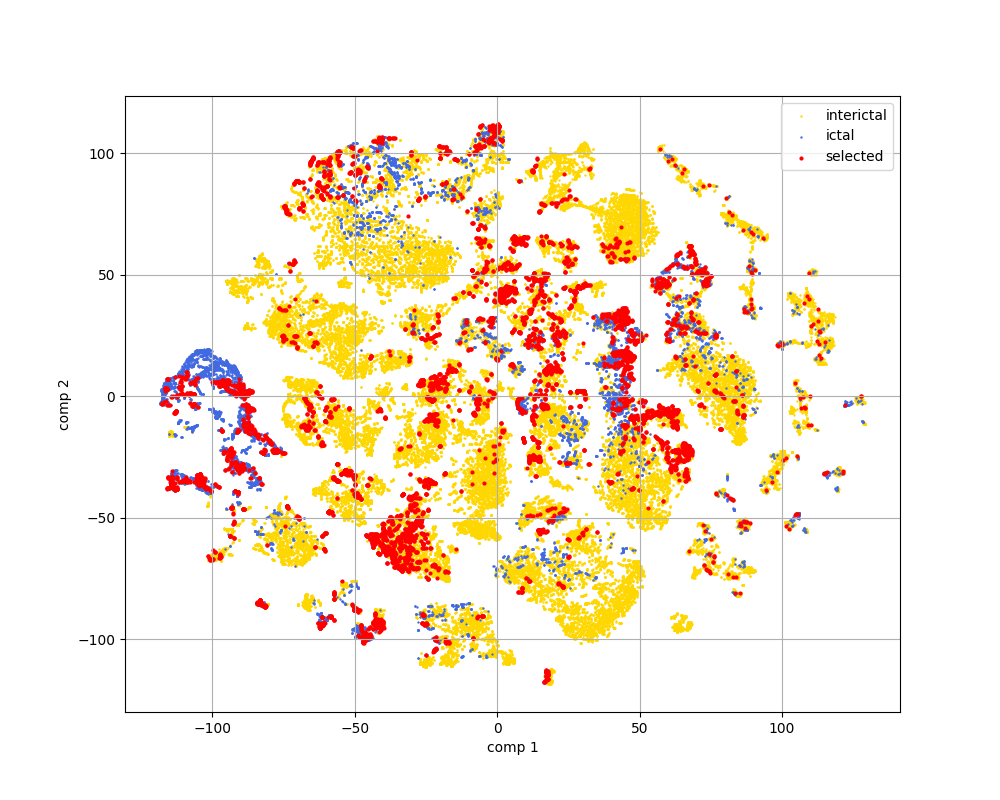

...

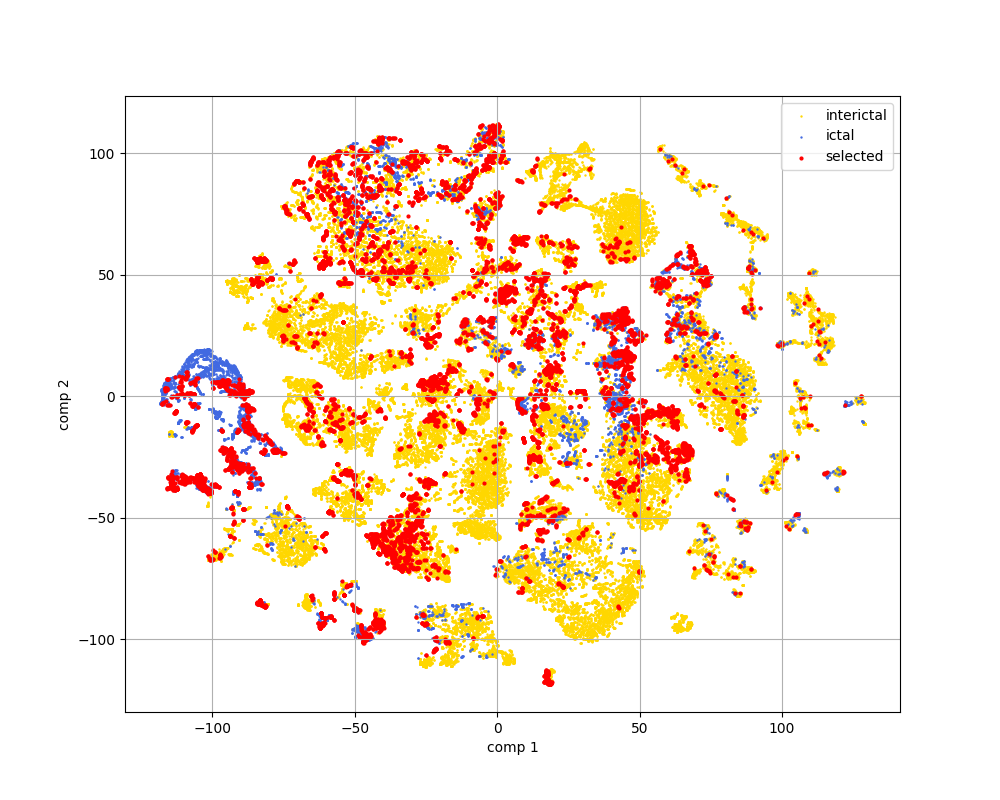

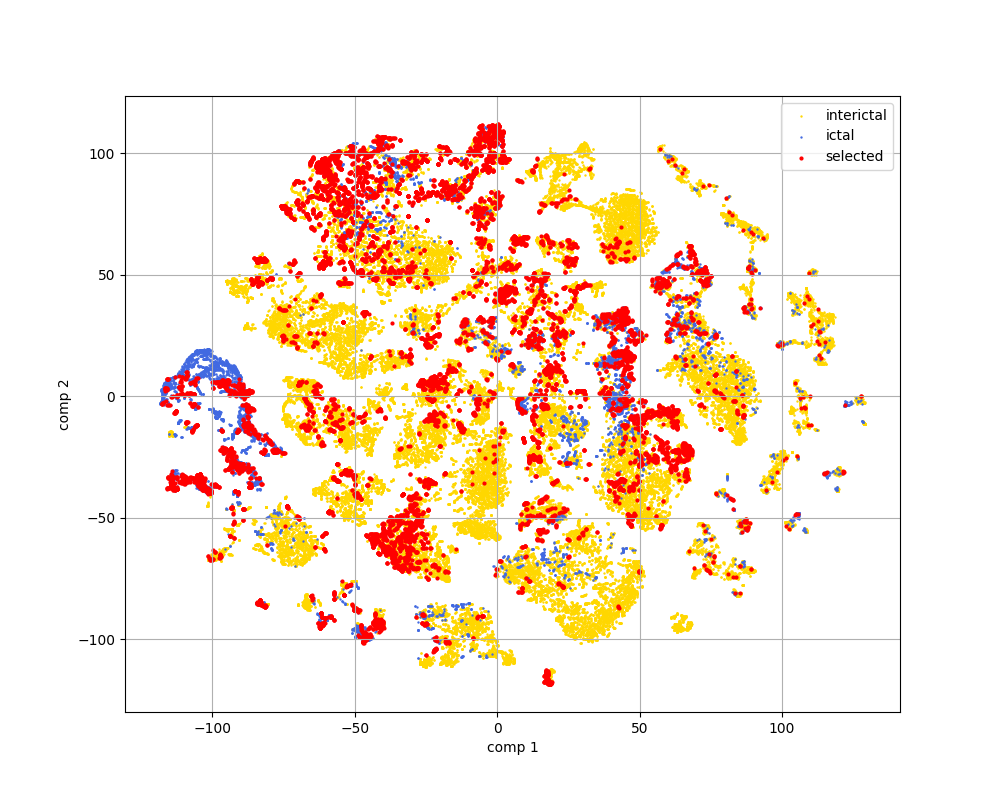

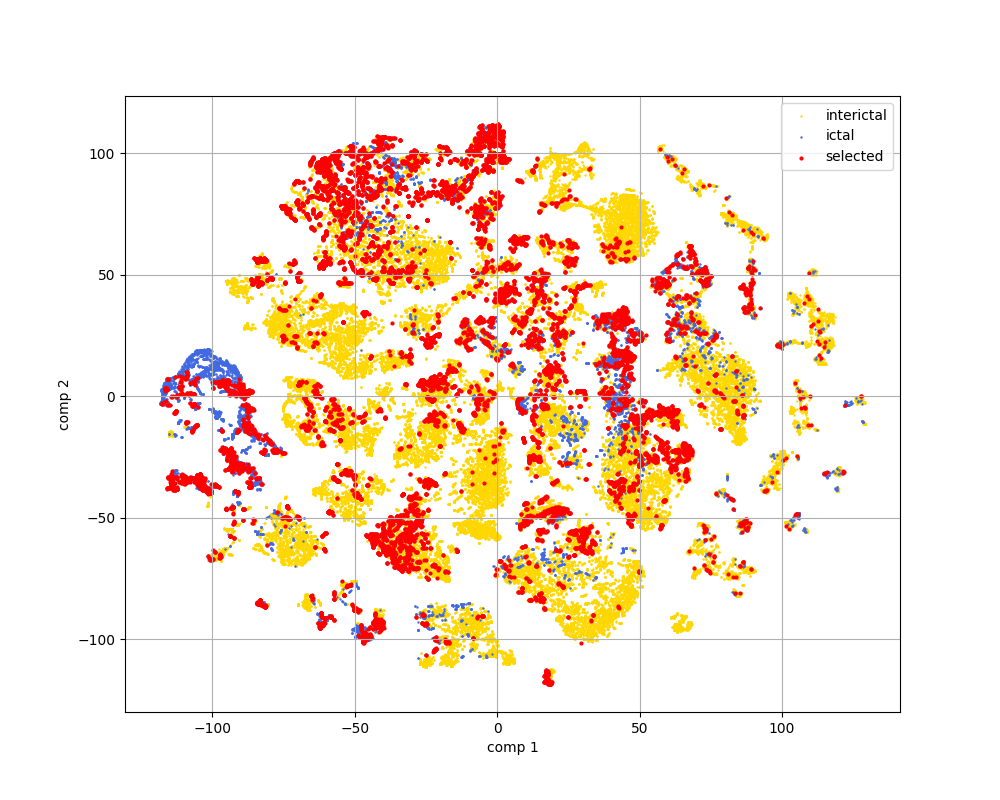

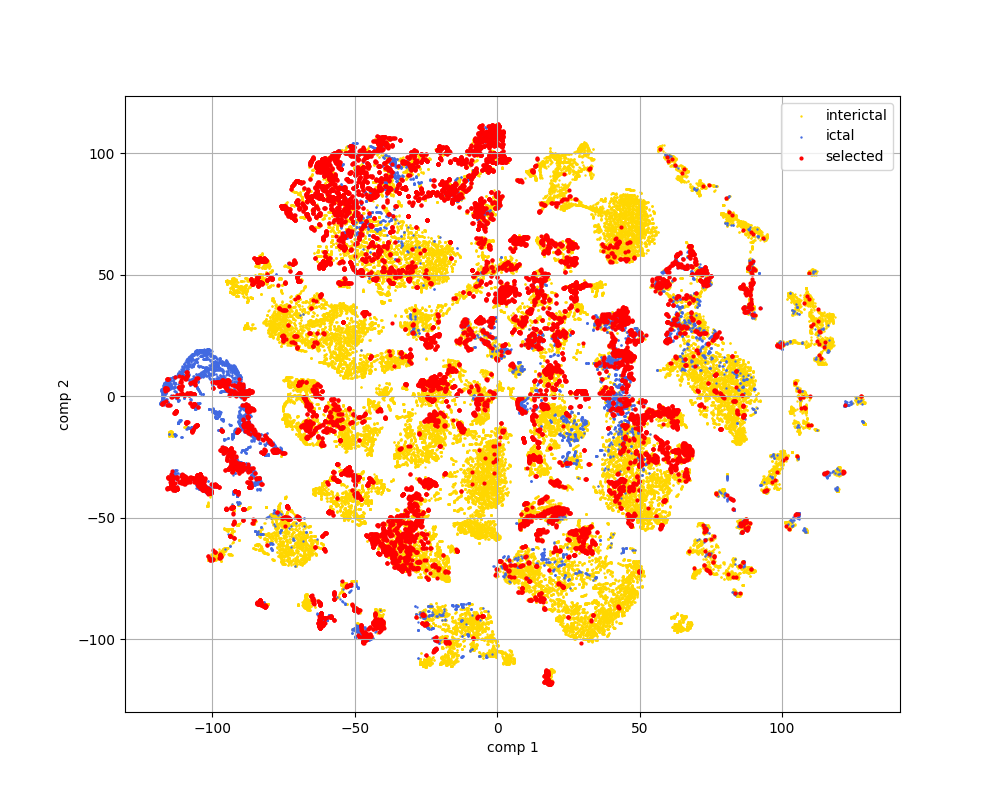

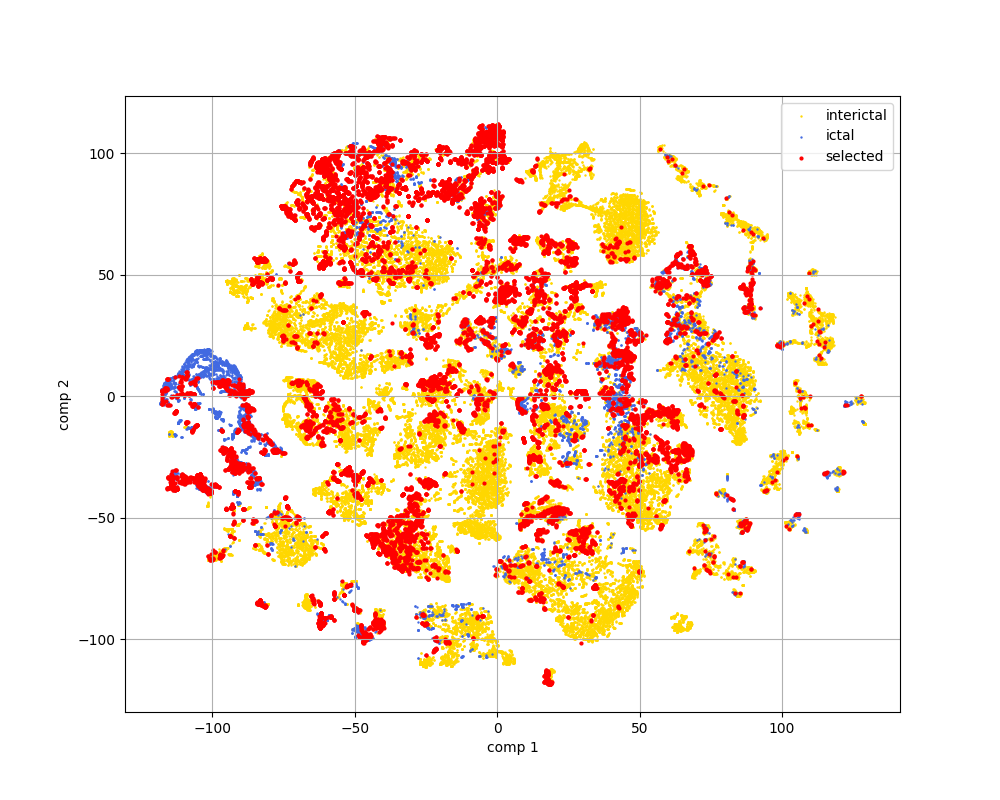

In [63]:
for i in range(len(added_index_lc)):

    plt.figure(figsize=(10, 8))
    plt.scatter(spc[interictal_inds,0],spc[interictal_inds,1],c='gold',label= 'interictal',s=0.5)
    plt.scatter(spc[ictal_inds, 0], spc[ictal_inds, 1], c='royalblue', label='ictal',s=0.5)
    plt.scatter(spc[added_index_lc[i]][:,0], spc[added_index_lc[i]][:,1], c='red', label='selected',s=4)

    # plt.title('Swav Embedding t-SNE')
    plt.xlabel('comp 1')
    plt.ylabel("comp 2")
    plt.legend()
    # plt.xlim(-67, 74)
    # plt.ylim(-67, 75)
    plt.grid()
    plt.show()

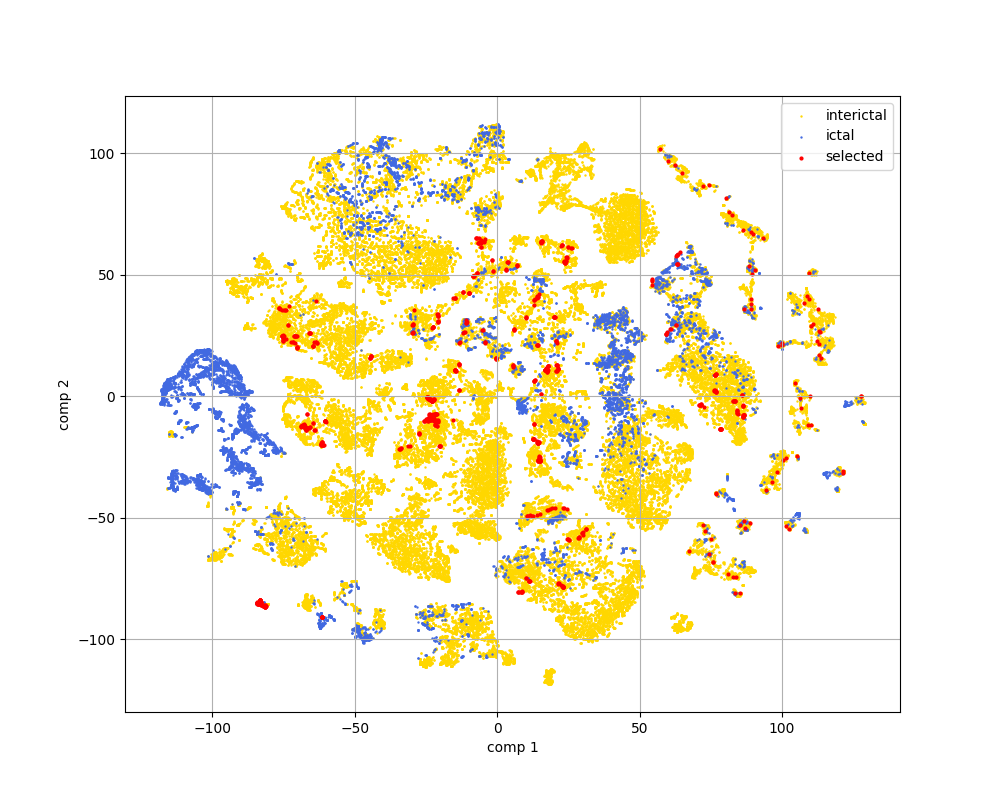

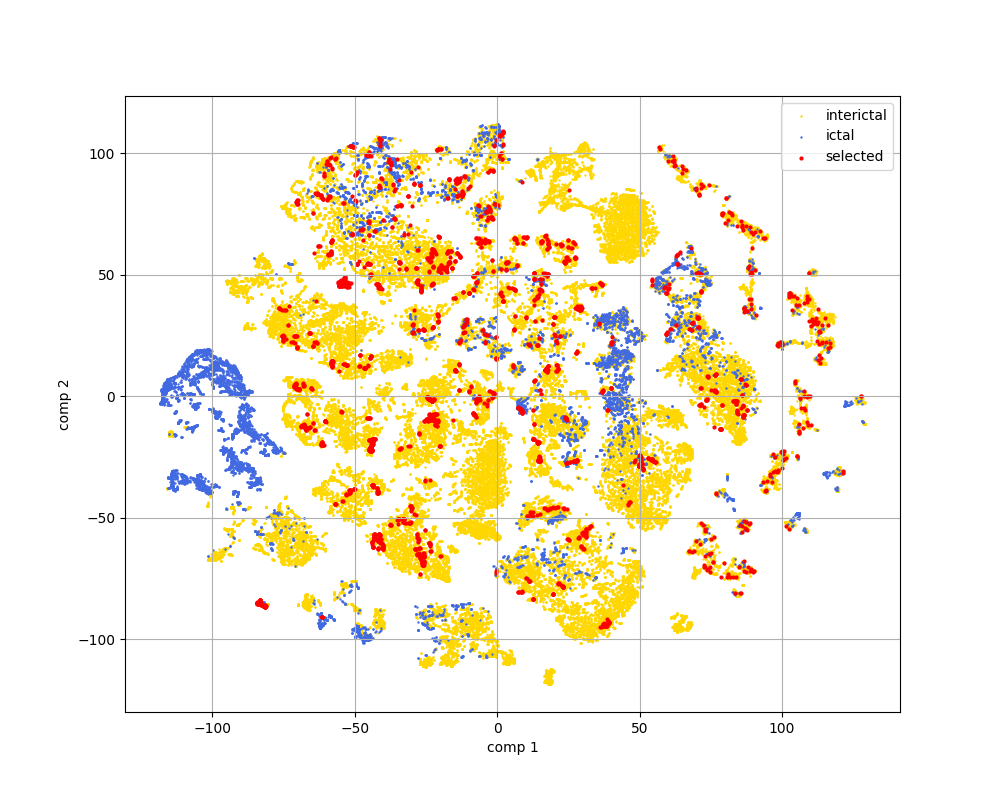

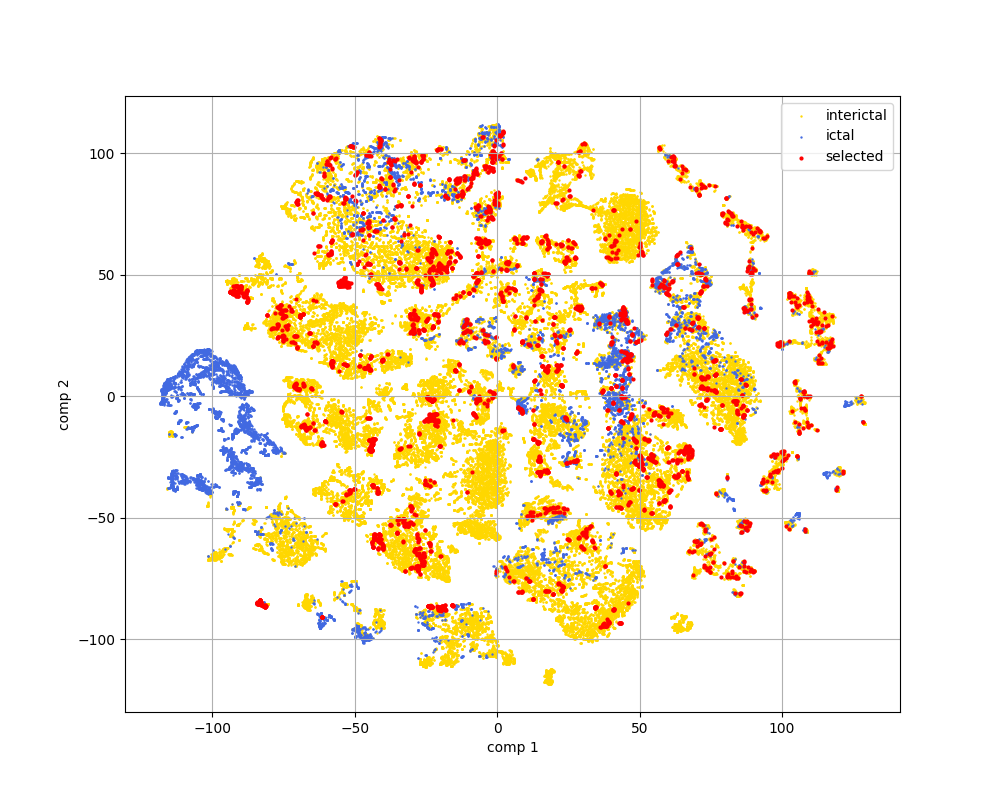

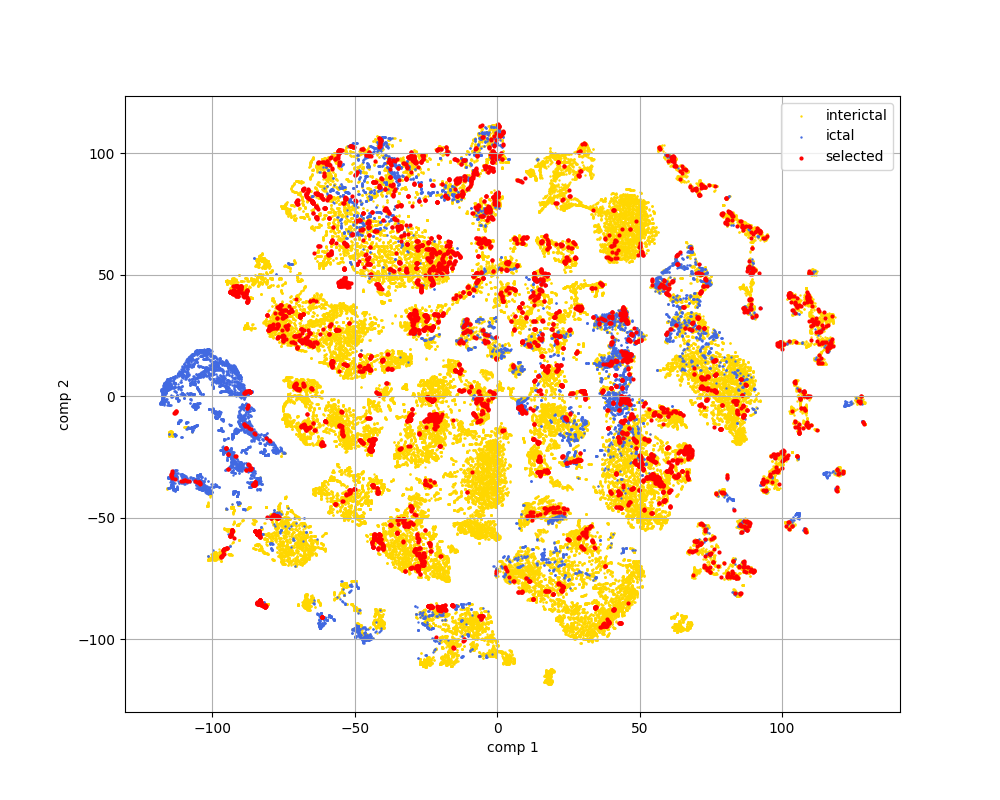

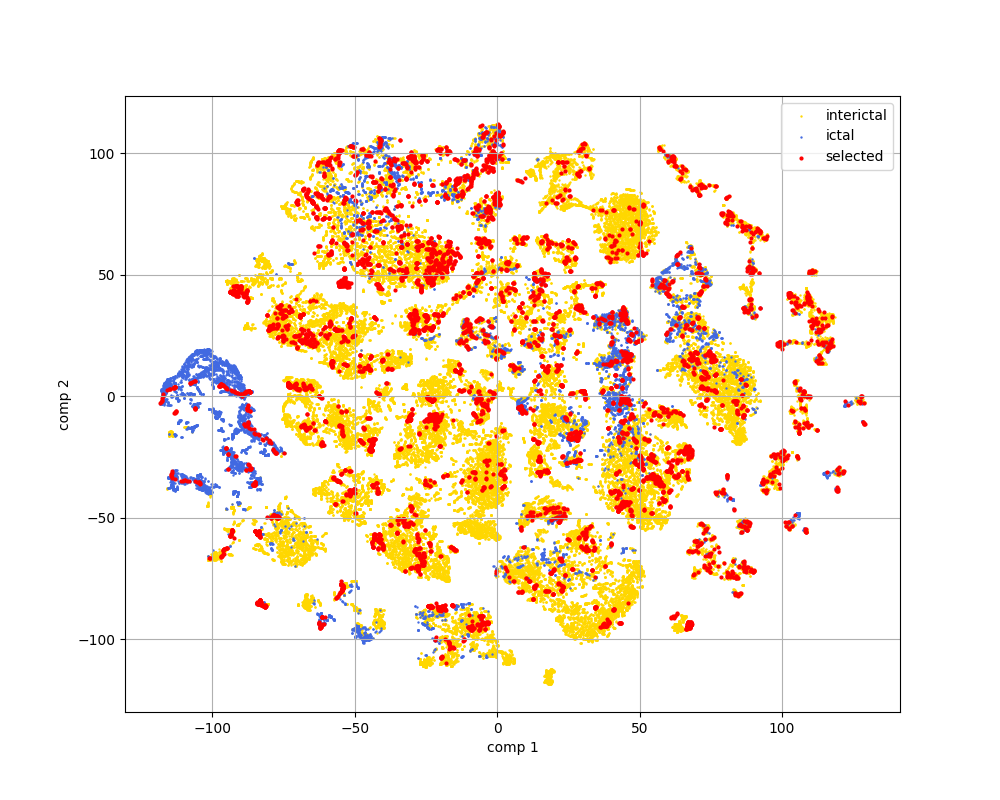

...

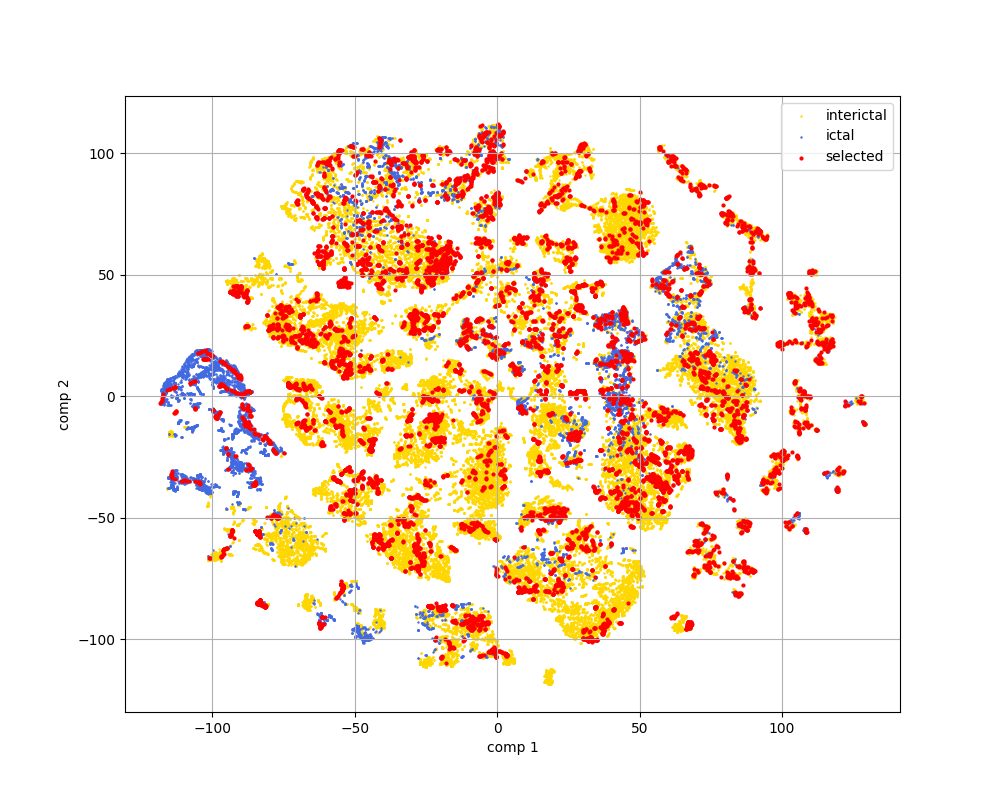

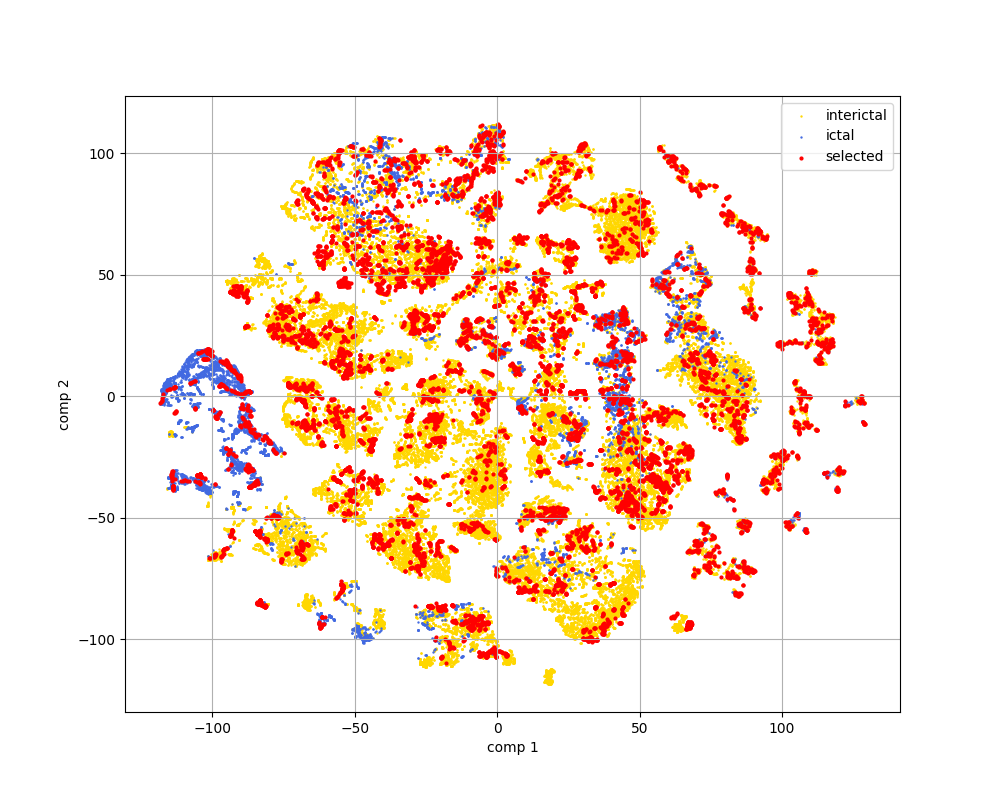

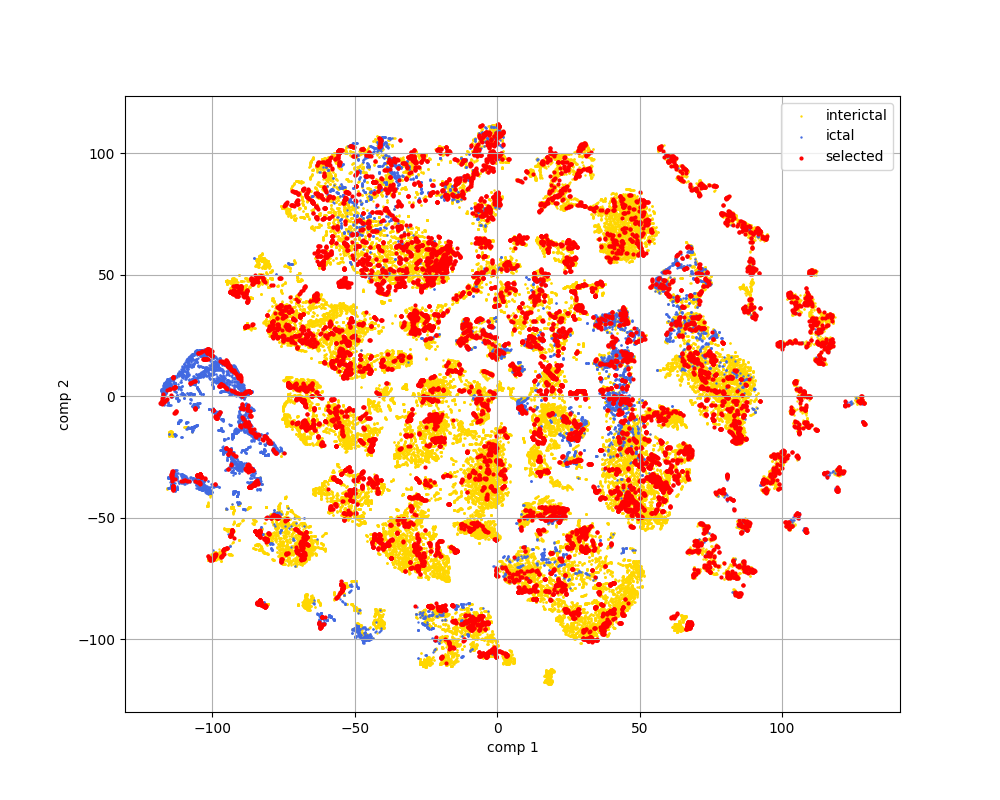

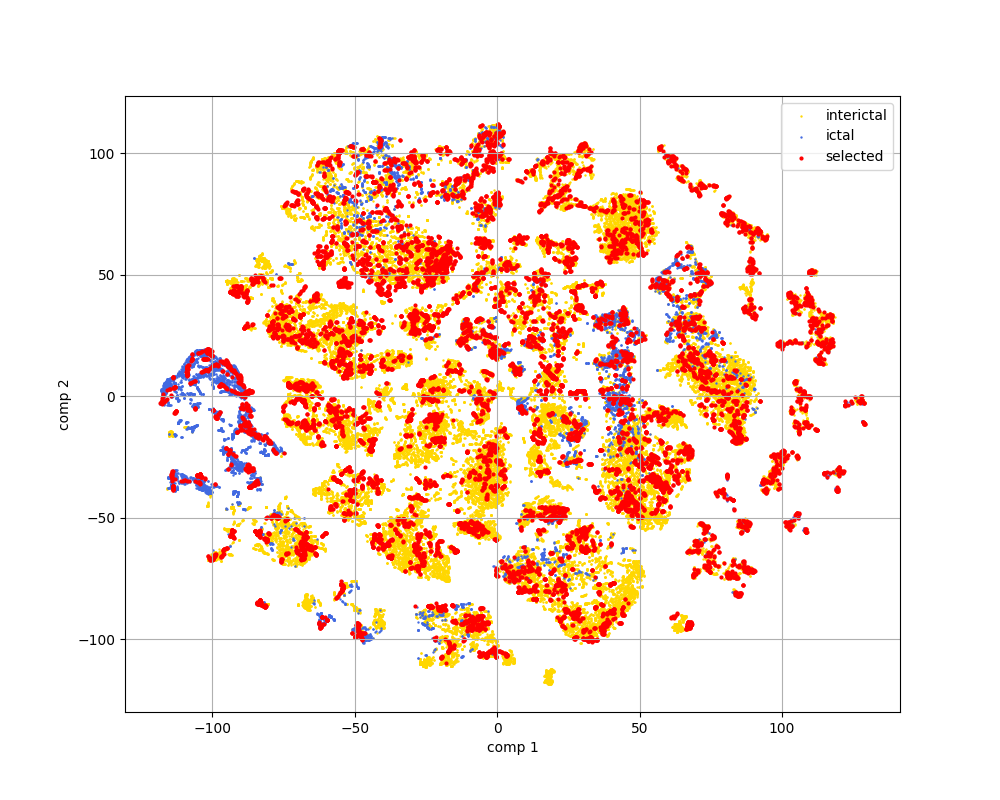

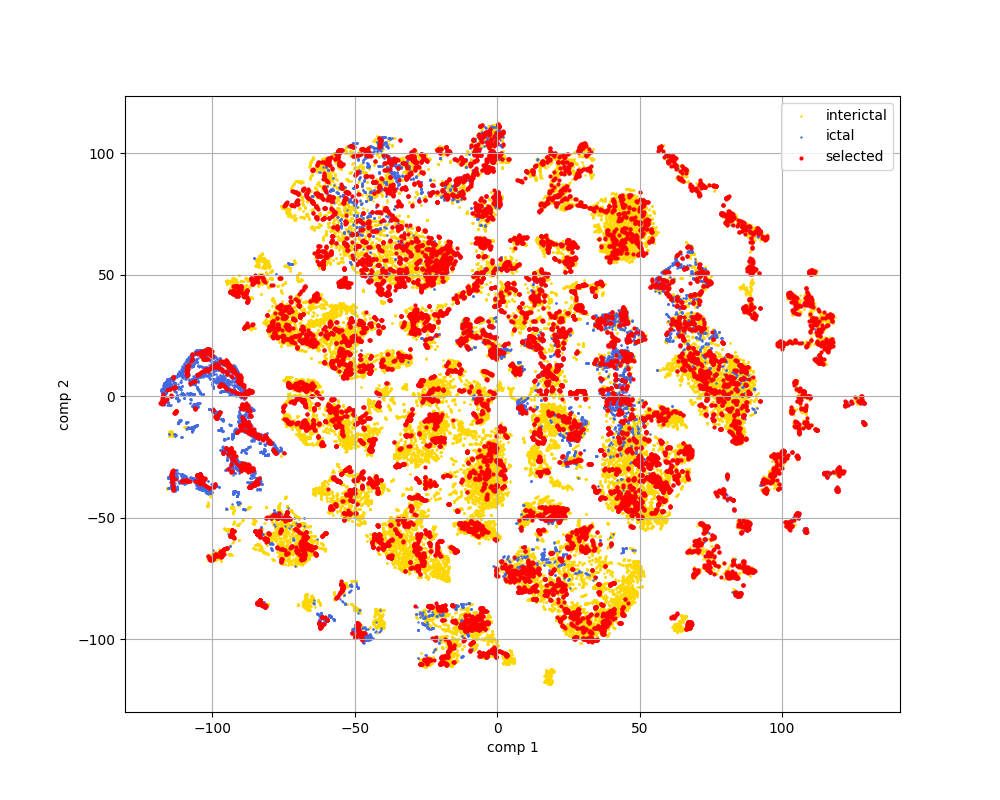

In [62]:
for i in range(len(added_index_lc)):

    plt.figure(figsize=(10, 8))
    plt.scatter(spc[interictal_inds,0],spc[interictal_inds,1],c='gold',label= 'interictal',s=0.5)
    plt.scatter(spc[ictal_inds, 0], spc[ictal_inds, 1], c='royalblue', label='ictal',s=0.5)
    plt.scatter(spc[added_index_rd[i]][:,0], spc[added_index_rd[i]][:,1], c='red', label='selected',s=4)

    # plt.title('Swav Embedding t-SNE')
    plt.xlabel('comp 1')
    plt.ylabel("comp 2")
    plt.legend()
    # plt.xlim(-67, 74)
    # plt.ylim(-67, 75)
    plt.grid()
    plt.show()

In [37]:
spc[ictal_inds,0]

array([ 70.04339 ,  68.559784,  67.93174 , ..., 103.81576 , 117.67819 ,
       124.655365], dtype=float32)

In [27]:
target

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [31]:
episode_labeled_lc = [np.sum(np.sign(np.diff(added_index_lc[i])-1)) for i in range(len(added_index_lc))]
episode_labeled_lc

[8, 63, 81, 35, 94, 57, 67, 57, 56, 72, 45]

In [40]:
episode_labeled_rd = [np.sum(np.sign(np.abs(np.diff(added_index_rd[i])-1))) for i in range(len(added_index_rd))]
episode_labeled_rd

[8, 18, 18, 18, 18, 18, 18, 18, 18, 18, 17]